In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import shapely
import geopandas as gpd
import pandas as pd
import numpy as np
import time
import math
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [3]:
# Mapping des classes
change_type_map = {
    'Demolition': 0,
    'Road': 1,
    'Residential': 2,
    'Commercial': 3,
    'Industrial': 4,
    'Mega Projects': 5
}

train_df_geojson = gpd.read_file('data/train.geojson', engine="pyogrio")
test_df_geojson = gpd.read_file('data/test.geojson', engine="pyogrio")

DataSourceError: data/train.geojson: No such file or directory

In [3]:
train_df = train_df_geojson.copy()
test_df = test_df_geojson.copy()

In [1]:
# Number of missing values per column
missing_count = train_df.isna().sum()

# Percentage of missing values per column
missing_percent = train_df.isna().mean() * 100

# Combine into one table for readability
missing_table = (
    pd.concat([missing_count, missing_percent], axis=1)
    .rename(columns={0: 'Missing Values', 1: 'Percentage'})
)

# Optional: sort by missing values descending
missing_table = missing_table.sort_values(by='Missing Values', ascending=False)

missing_table


NameError: name 'train_df' is not defined

=== train_df : missing values ===
=== test_df : missing values ===


<Axes: >

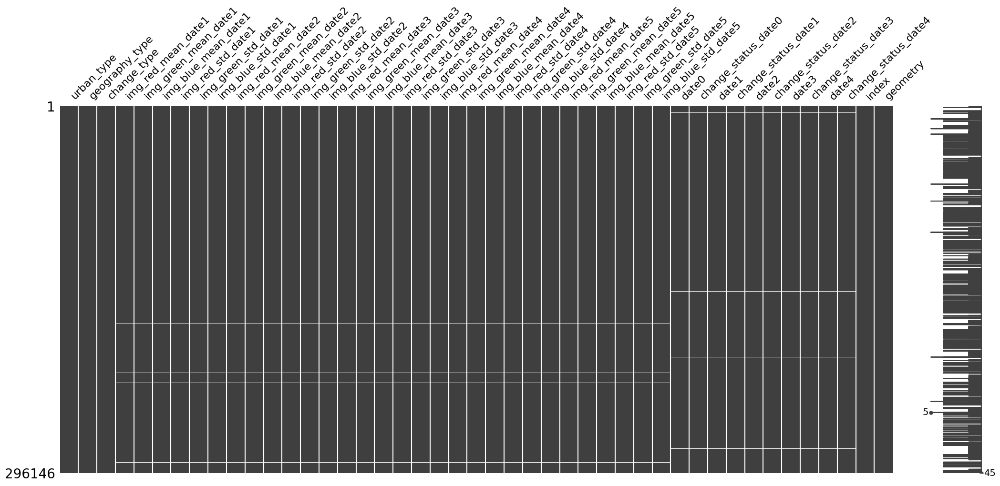

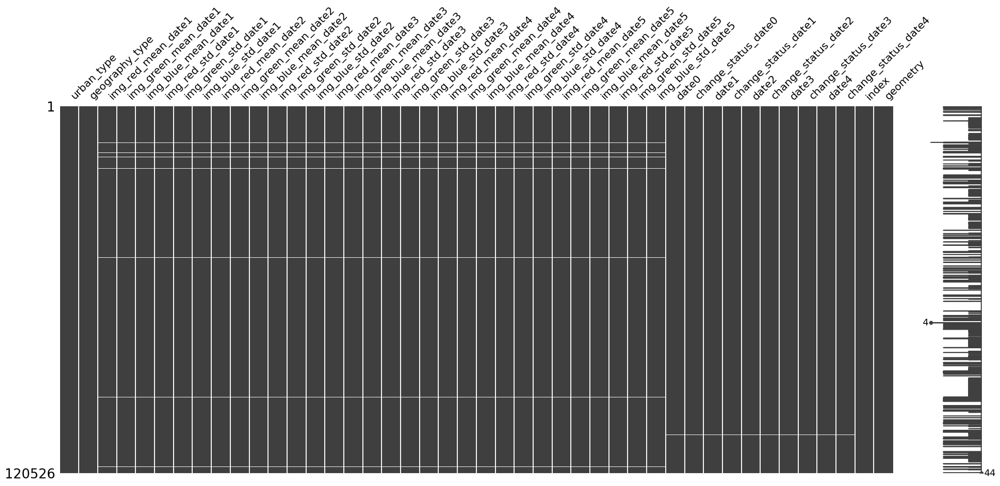

In [7]:
print("=== train_df : missing values ===")
msno.matrix(train_df)

print("=== test_df : missing values ===")
msno.matrix(test_df)


In [8]:
train_df = train_df.dropna(axis=0)
train_df = train_df.reset_index(drop=True)

In [9]:
# Urban type one-hot encoding

import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

# Transformer chaque cellule en liste de labels
train_labels = train_df["urban_type"].str.split(",")
test_labels  = test_df["urban_type"].str.split(",")

# One-hot encoding multi-label
mlb = MultiLabelBinarizer()
train_encoded = pd.DataFrame(mlb.fit_transform(train_labels), columns=mlb.classes_, index=train_df.index)
test_encoded  = pd.DataFrame(mlb.transform(test_labels), columns=mlb.classes_, index=test_df.index)

# Ajouter un préfixe 'urban_type_' à toutes les colonnes
train_encoded = train_encoded.add_prefix('urban_type_')
test_encoded  = test_encoded.add_prefix('urban_type_')

# Fusionner certaines colonnes si nécessaire (ex: A et N)
if 'urban_type_A' in train_encoded.columns and 'urban_type_N' in train_encoded.columns:
    train_encoded['urban_type_N,A'] = train_encoded['urban_type_N'] | train_encoded['urban_type_A']
    test_encoded['urban_type_N,A']  = test_encoded['urban_type_N']  | test_encoded['urban_type_A']
    train_encoded.drop(['urban_type_A','urban_type_N'], axis=1, inplace=True)
    test_encoded.drop(['urban_type_A','urban_type_N'], axis=1, inplace=True)

# Ajouter au DataFrame original
train_df = pd.concat([train_df, train_encoded], axis=1)
test_df  = pd.concat([test_df, test_encoded], axis=1)

# One-hot encoding des combinaisons fréquentes (top 10)
top_combis = train_df["urban_type"].value_counts().head(10).index
for combi in top_combis:
    if "," in combi:  # seulement les combinaisons
        train_df[f'urban_type_{combi}'] = (train_df['urban_type'] == combi).astype(float)
        test_df[f'urban_type_{combi}']  = (test_df['urban_type'] == combi).astype(float)

# (Optionnel) Supprimer la colonne originale
# train_df.drop('urban_type', axis=1, inplace=True)
# test_df.drop('urban_type', axis=1, inplace=True)


In [10]:
# Geography one-hot encoding

# Transformer chaque cellule en liste de labels
train_labels = train_df["geography_type"].str.split(",")
test_labels  = test_df["geography_type"].str.split(",")

# One-hot encoding multi-label
mlb = MultiLabelBinarizer()
train_encoded = pd.DataFrame(mlb.fit_transform(train_labels), columns=mlb.classes_, index=train_df.index)
test_encoded  = pd.DataFrame(mlb.transform(test_labels), columns=mlb.classes_, index=test_df.index)

# Ajouter un préfixe geography_type_ pour toutes les colonnes
train_encoded = train_encoded.add_prefix('geography_type_')
test_encoded  = test_encoded.add_prefix('geography_type_')

# Fusionner certaines colonnes si nécessaire (ex: A et N)
if 'geography_type_A' in train_encoded.columns and 'geography_type_N' in train_encoded.columns:
    train_encoded['geography_type_N,A'] = train_encoded['geography_type_N'] | train_encoded['geography_type_A']
    test_encoded['geography_type_N,A']  = test_encoded['geography_type_N']  | test_encoded['geography_type_A']
    train_encoded.drop(['geography_type_A','geography_type_N'], axis=1, inplace=True)
    test_encoded.drop(['geography_type_A','geography_type_N'], axis=1, inplace=True)

# Ajouter au DataFrame original
train_df = pd.concat([train_df, train_encoded], axis=1)
test_df  = pd.concat([test_df, test_encoded], axis=1)

# One-hot encoding des combinaisons fréquentes (top 20)
top_combis = train_df["geography_type"].value_counts().head(20).index
for combi in top_combis:
    if "," in combi:  # seulement les combinaisons
        train_df[f'geography_type_{combi}'] = (train_df['geography_type'] == combi).astype(float)
        test_df[f'geography_type_{combi}']  = (test_df['geography_type'] == combi).astype(float)

# Supprimer la colonne originale
# train_df.drop('geography_type', axis=1, inplace=True)
# test_df.drop('geography_type', axis=1, inplace=True)


In [12]:
# Créer des features combinant geography_type et urban_type
combisGeoUrban = []
for column1 in train_df.columns:
    if not column1.startswith("geography_type") or len(column1.split(",")) != 1 or column1 == "geography_type":
        continue
    for column2 in train_df.columns:
        if not column2.startswith("urban_type") or len(column2.split(",")) != 1 or column2 == "urban_type":
            continue

        #maxVal corresponds to the maximum proportion observed in a change_type, for a given geography_type column1 and urban_type column2    
        maxVal = -np.inf
        for change_type in train_df["change_type"].unique():
            maxVal = max(maxVal, (train_df[train_df["change_type"]==change_type][column1]*train_df[train_df["change_type"]==change_type][column2]).mean())
        if maxVal > 0.01:
            for df in [train_df, test_df]:
                df[f'geourban_{column1}_{column2}'] = df[column1]*df[column2]

In [13]:
# Reindicage de date 
import pandas as pd
import numpy as np

# Préfixes à traiter
col_prefixes = [
    "img_red_mean_date", "img_green_mean_date", "img_blue_mean_date",
    "img_red_std_date", "img_green_std_date", "img_blue_std_date",
    "change_status_date", "date"
]

for df in [train_df, test_df]:
    # --- 1. Identifier toutes les colonnes existantes pour chaque préfixe ---
    prefix_to_cols = {}
    for prefix in col_prefixes:
        prefix_to_cols[prefix] = sorted([col for col in df.columns if col.startswith(prefix)])

    # --- 2. Convertir les colonnes de dates existantes en datetime ---
    date_cols = prefix_to_cols["date"]
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors="coerce", format="%d-%m-%Y")

    # --- 3. Créer un tableau temporaire pour trier les dates ---
    dates_df = df[date_cols].fillna(pd.to_datetime("1970-01-01"))
    sorted_idx = np.argsort(dates_df.values, axis=1)

    # --- 4. Réordonner toutes les colonnes ligne par ligne ---
    for prefix, cols in prefix_to_cols.items():
        sorted_values = pd.DataFrame(
            [row[sorted_idx[i]] for i, row in enumerate(df[cols].values)],
            index=df.index
        )
        # Renommer les colonnes de 0 à N-1
        sorted_values.columns = [f"{prefix}{i}" for i in range(len(cols))]
        df[[f"{prefix}{i}" for i in range(len(cols))]] = sorted_values


In [13]:
train_df[[f"date{i}" for i in range(5)]].head()

,date0,date1,date2,date3,date4
0,2013-12-09,2016-09-10,2017-07-24,2018-08-01,2019-07-22
1,2013-12-09,2016-09-10,2017-07-24,2018-08-01,2019-07-22
2,2013-12-09,2016-09-10,2017-07-24,2018-08-01,2019-07-22
3,2013-12-09,2016-09-10,2017-07-24,2018-08-01,2019-07-22
4,2013-12-09,2016-09-10,2017-07-24,2018-08-01,2019-07-22


In [15]:
new_dummies = pd.get_dummies(train_df[[f"change_status_date{i}" for i in range(5)]], dtype=float)
train_df = pd.concat([train_df, new_dummies], axis=1)

new_dummies = pd.get_dummies(test_df[[f"change_status_date{i}" for i in range(5)]], dtype=float)
test_df = pd.concat([test_df, new_dummies], axis=1)

In [16]:
# Rank by ordre chronologique des différentes étapes de construction
change_status_map = {
    "Prior Construction": 0,
    "Greenland": 1,
    "Land Cleared": 2,
    "Excavation": 3,
    "Materials Dumped": 4,
    "Materials Introduced": 5,
    "Construction Started": 6,
    "Construction Midway": 7,
    "Construction Done": 8,
    "Operational": 9,
}


In [17]:
# Features sur les status de construction
for df in [train_df, test_df]:
    for status in change_status_map:
        df[f"change_status_{status}"] = df[f"change_status_date0_{status}"]\
                                        +df[f"change_status_date1_{status}"]\
                                        +df[f"change_status_date2_{status}"]\
                                        +df[f"change_status_date3_{status}"]\
                                        +df[f"change_status_date4_{status}"]
                                        
# Encodage des colonnes change_status_date{iDate} 
for df in [train_df, test_df]:
    for iDate in range(5):
        df[f'change_status_date{iDate}_encoded'] = df[f'change_status_date{iDate}'].map(change_status_map)
        
# Donne une idée de combien d'étape de construction entre deux dates
for df in [train_df, test_df]:
    df['change_status_date_4-0'] = df['change_status_date4_encoded'] - df['change_status_date0_encoded']
    df['change_status_date_1-0'] = df['change_status_date1_encoded'] - df['change_status_date0_encoded']
    df['change_status_date_2-1'] = df['change_status_date2_encoded'] - df['change_status_date1_encoded']
    df['change_status_date_3-2'] = df['change_status_date3_encoded'] - df['change_status_date2_encoded']
    df['change_status_date_4-3'] = df['change_status_date4_encoded'] - df['change_status_date3_encoded']

In [18]:
# Feature sur les images

# Calcul de la moyenne et de l'écart-type global pour chaque date        
for df in [train_df, test_df]:
    for iDate in range(5):
        df[f'img_mean_date{iDate}'] = (df[f'img_red_mean_date{iDate}']+df[f'img_blue_mean_date{iDate}']+df[f'img_green_mean_date{iDate}'])/3
        df[f'img_std_date{iDate}'] = (df[f'img_red_std_date{iDate}']+df[f'img_blue_std_date{iDate}']+df[f'img_green_std_date{iDate}'])/3
        
# Variation de couleur et de texture
col_imgs = ["img_mean_date", "img_std_date", "img_red_mean_date", "img_green_mean_date", "img_blue_mean_date", "img_red_std_date", "img_green_std_date", "img_blue_std_date"]

for df in [train_df, test_df]:
    for col in col_imgs:
        df[f'{col}_4-0'] = df[f'{col}4'] - df[f'{col}0']
        df[f'{col}_1-0'] = df[f'{col}1'] - df[f'{col}0']
        df[f'{col}_2-1'] = df[f'{col}2'] - df[f'{col}1']
        df[f'{col}_3-2'] = df[f'{col}3'] - df[f'{col}2']
        df[f'{col}_4-3'] = df[f'{col}4'] - df[f'{col}3']
     
     
for df in [train_df, test_df]:
    for iDate in range(1, 5):
        df[f'date_{iDate}-{iDate-1}'] = (df[f'date{iDate}'] - df[f'date{iDate-1}']).dt.days
    df[f'date_4-0'] = (df[f'date4'] - df[f'date0']).dt.days
    
cols = ["img_mean_date", "img_std_date", "img_red_mean_date", "img_green_mean_date", "img_blue_mean_date", "img_red_std_date", "img_green_std_date", "img_blue_std_date", "change_status_date"]

for df in [train_df, test_df]:
    for col in cols:
        df[f'{col}_4-0/Date'] = df[f'{col}_4-0'] / df['date_4-0']
        df[f'{col}_1-0/Date'] = df[f'{col}_1-0'] / df['date_1-0']
        df[f'{col}_2-1/Date'] = df[f'{col}_2-1'] / df['date_2-1']
        df[f'{col}_3-2/Date'] = df[f'{col}_3-2'] / df['date_3-2']
        df[f'{col}_4-3/Date'] = df[f'{col}_4-3'] / df['date_4-3']
    


In [19]:
import shapely
from scipy.spatial import distance


def calculate_diameter(geometry):
    polygon = np.array(geometry.exterior.coords)
    pairwise_distances = distance.pdist(polygon)
    diameter = pairwise_distances.max()
    return diameter

def n_vertices(g):
        try:
            return len(g.exterior.coords)
        except Exception:
            return 0


In [20]:
for df in [train_df, test_df]:
    df['geometry_longitude'] = df['geometry'].centroid.x 
    df['geometry_latitude'] = df['geometry'].centroid.y
    df_proj = df.to_crs("EPSG:3857")
    df['geometry_area'] = df_proj['geometry'].area
    df['geometry_perimeter'] = df_proj['geometry'].length
    df['geometry_inscribed_circle_radius'] = 2 * df['geometry_area'] / df['geometry_perimeter']
    df['geometry_compactness'] = 4 * math.pi * df['geometry_area'] / (df['geometry_perimeter']**2)
    df['geometry_convexity_ratio'] = df_proj['geometry'].apply(lambda g: g.area / g.convex_hull.area if g is not None and g.is_valid and not g.is_empty else np.nan)
    bounds = df_proj['geometry'].bounds
    df['geometry_bboxwidth'] = bounds['maxx'] - bounds['minx']
    df['geometry_bboxheight'] = bounds['maxy'] - bounds['miny']
    df['geometry_bboxratio'] = df['geometry_bboxwidth'] / df['geometry_bboxheight']
    df['geometry_bboxarea'] = df['geometry_bboxwidth'] * df['geometry_bboxheight']
    df['geometry_bboxperimeter'] = 2 * (df['geometry_bboxwidth'] + df['geometry_bboxheight'])
    df['geometry_diameter'] = df_proj['geometry'].apply(calculate_diameter)
    df["geometry_vertices"] = df['geometry'].apply(n_vertices)
    df['geometry_minumum_bounding_circle'] = df['geometry'].minimum_bounding_radius()
    df['geometry_minimum_rotated_rectangle'] = df['geometry'].minimum_rotated_rectangle().area

In [21]:
import numpy as np

# Liste des colonnes que tu viens de calculer
geom_cols = [
    'geometry_longitude', 'geometry_latitude', 'geometry_area', 'geometry_perimeter',
    'geometry_inscribed_circle_radius', 'geometry_compactness', 'geometry_convexity_ratio',
    'geometry_bboxwidth', 'geometry_bboxheight', 'geometry_bboxratio',
    'geometry_bboxarea', 'geometry_bboxperimeter', 'geometry_diameter',
    'geometry_vertices', 'geometry_minumum_bounding_circle', 'geometry_minimum_rotated_rectangle'
]

# Vérification des inf ou -inf
for col in geom_cols:
    if col in train_df.columns:
        inf_count = np.isinf(train_df[col]).sum()
        if inf_count > 0:
            print(f"{col} contient {inf_count} valeurs infinies")
        else:
            print(f"{col} ne contient pas de valeurs infinies")


geometry_longitude ne contient pas de valeurs infinies
geometry_latitude ne contient pas de valeurs infinies
geometry_area ne contient pas de valeurs infinies
geometry_perimeter contient 2 valeurs infinies
geometry_inscribed_circle_radius ne contient pas de valeurs infinies
geometry_compactness ne contient pas de valeurs infinies
geometry_convexity_ratio ne contient pas de valeurs infinies
geometry_bboxwidth contient 15 valeurs infinies
geometry_bboxheight contient 15 valeurs infinies
geometry_bboxratio ne contient pas de valeurs infinies
geometry_bboxarea contient 15 valeurs infinies
geometry_bboxperimeter contient 15 valeurs infinies
geometry_diameter contient 2 valeurs infinies
geometry_vertices ne contient pas de valeurs infinies
geometry_minumum_bounding_circle ne contient pas de valeurs infinies
geometry_minimum_rotated_rectangle ne contient pas de valeurs infinies


geometry_longitude ne contient pas de valeurs infinies ou NaN
geometry_latitude ne contient pas de valeurs infinies ou NaN

geometry_area contient 32 valeurs infinies ou NaN. Affichage des polygones :


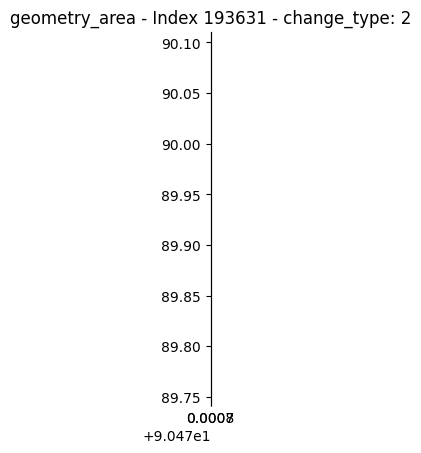

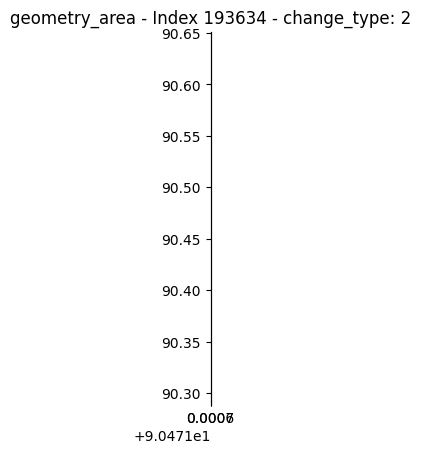

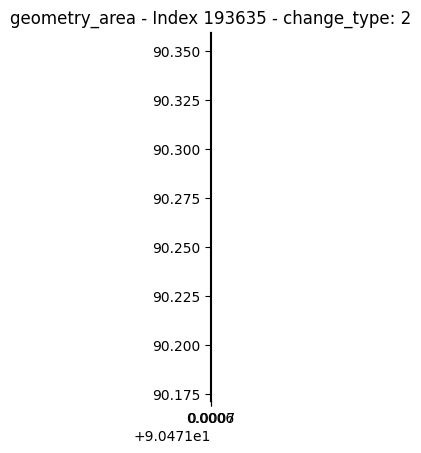

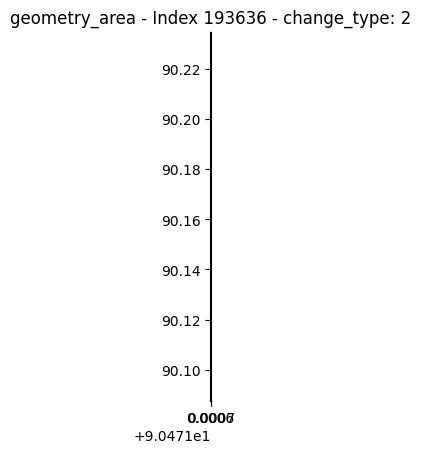

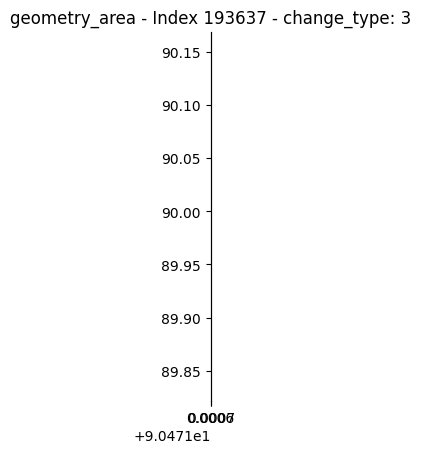

...

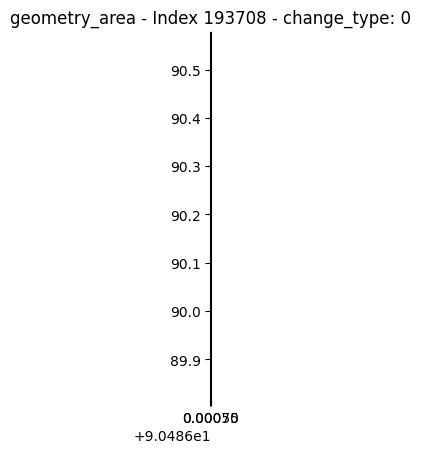

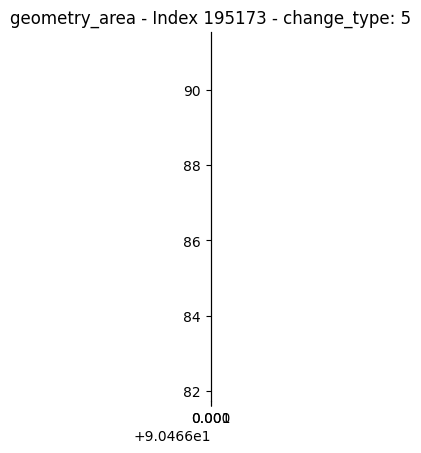

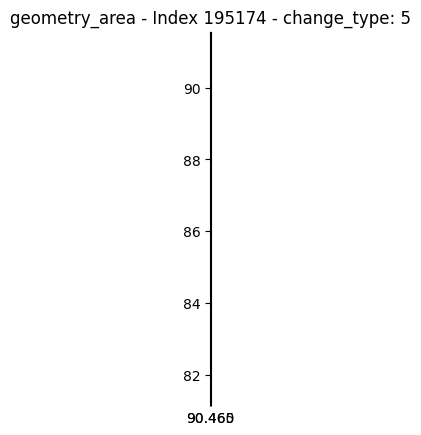

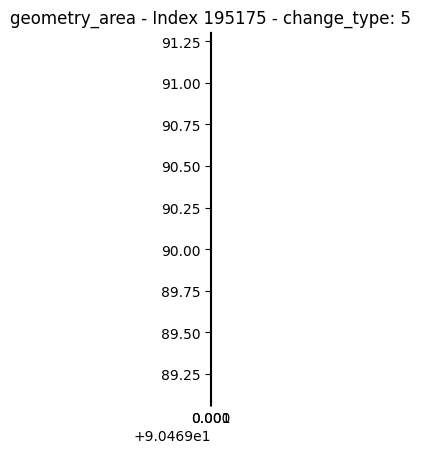

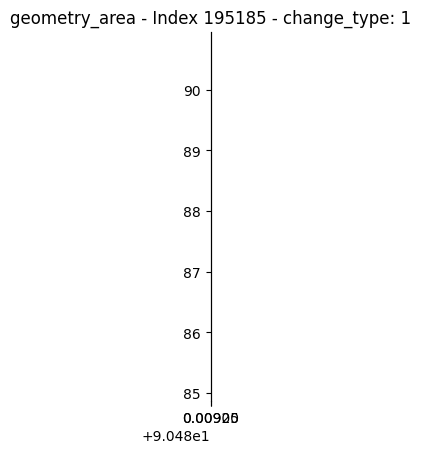


geometry_perimeter contient 32 valeurs infinies ou NaN. Affichage des polygones :


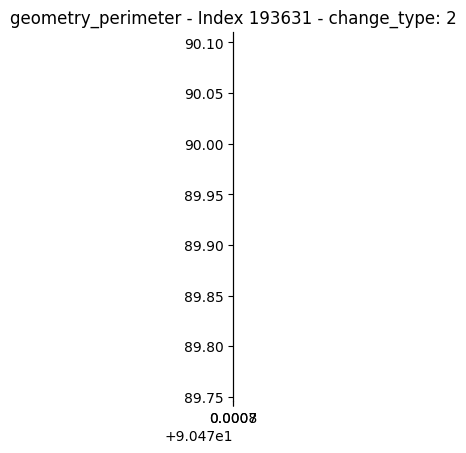

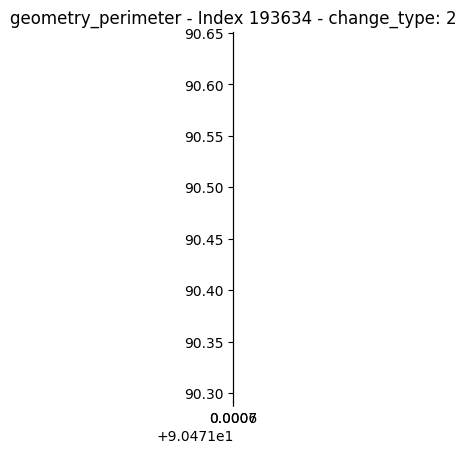

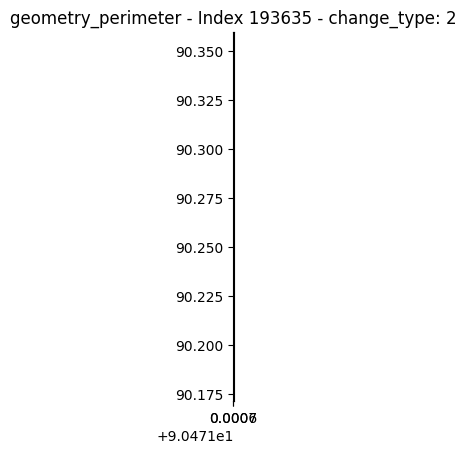

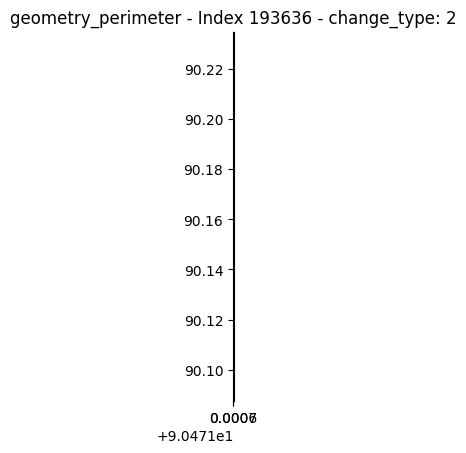

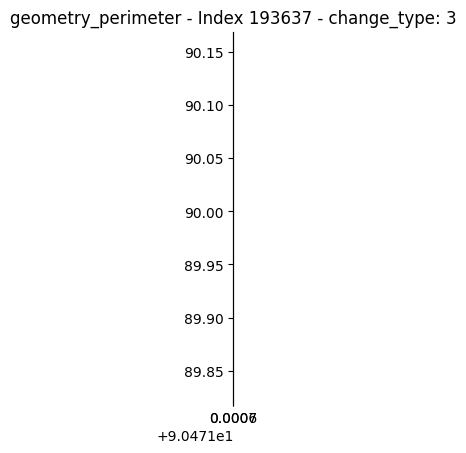

...

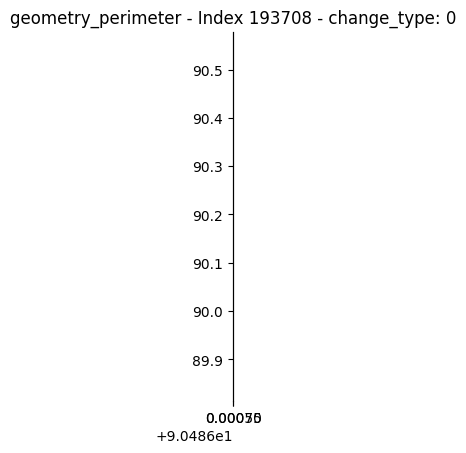

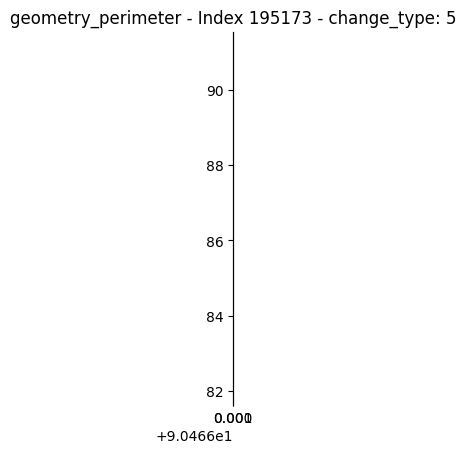

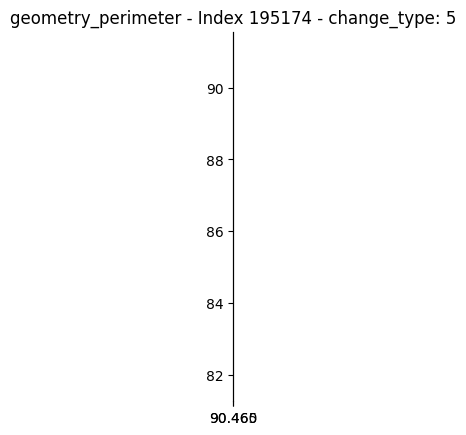

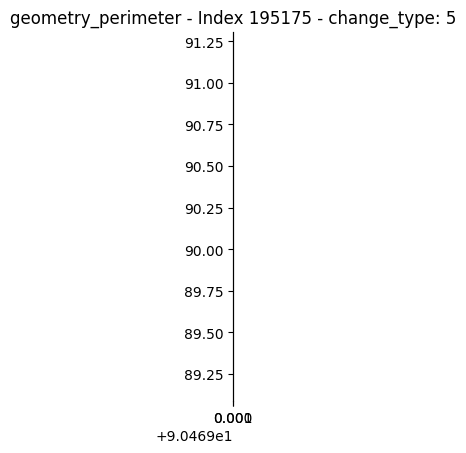

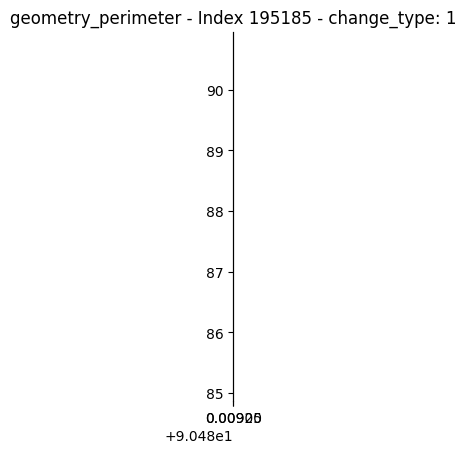


geometry_inscribed_circle_radius contient 32 valeurs infinies ou NaN. Affichage des polygones :


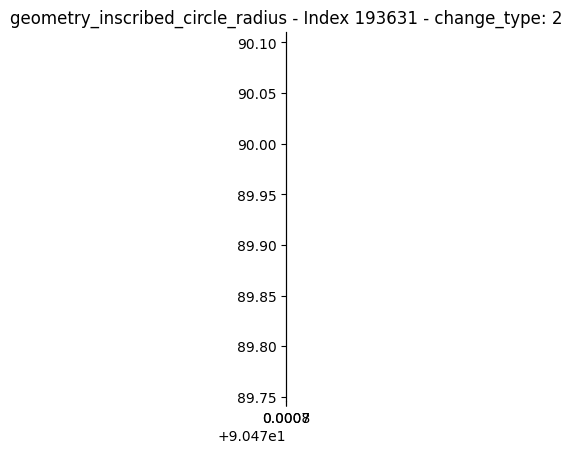

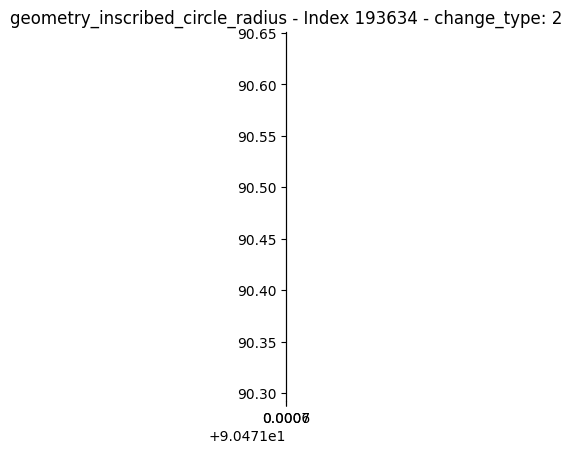

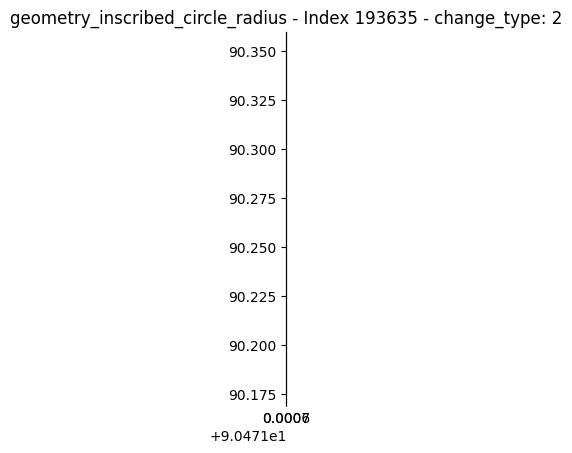

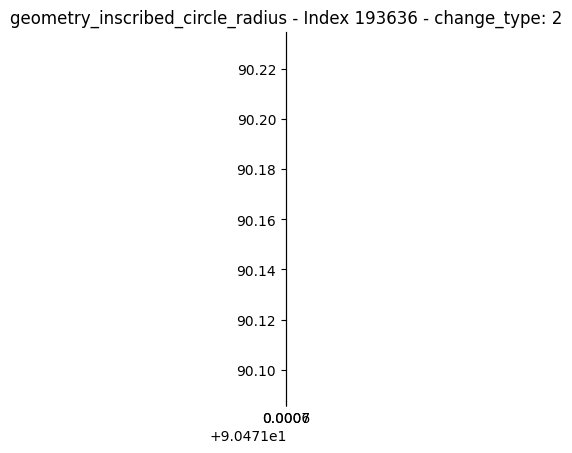

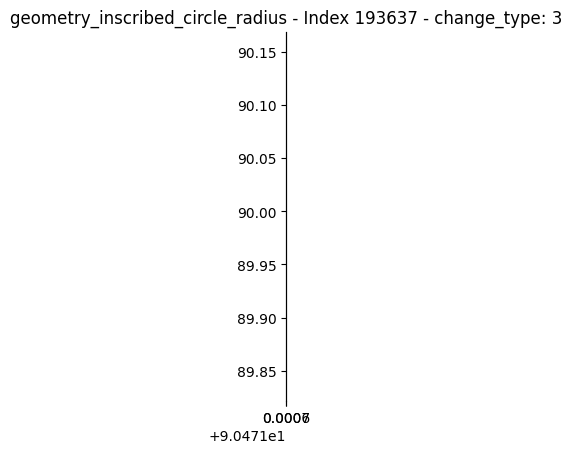

...

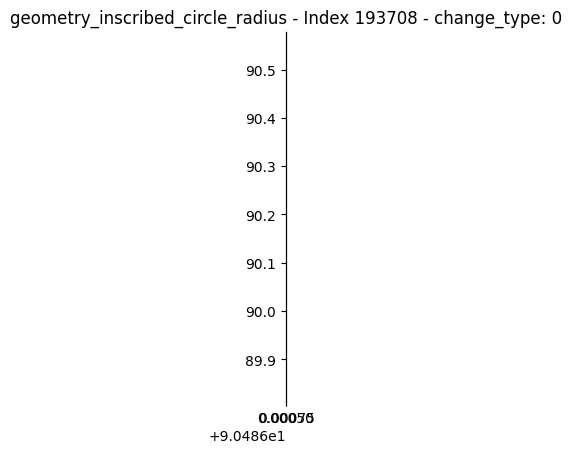

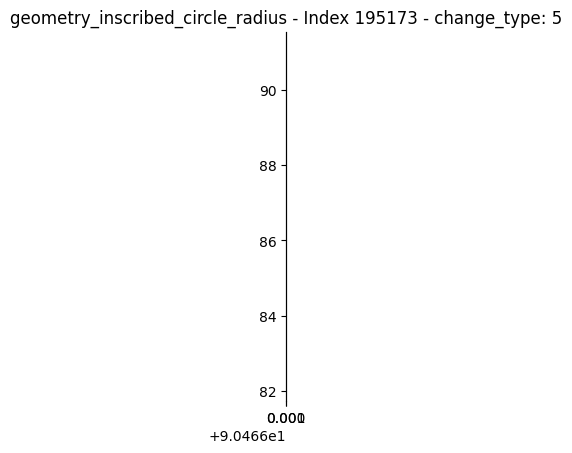

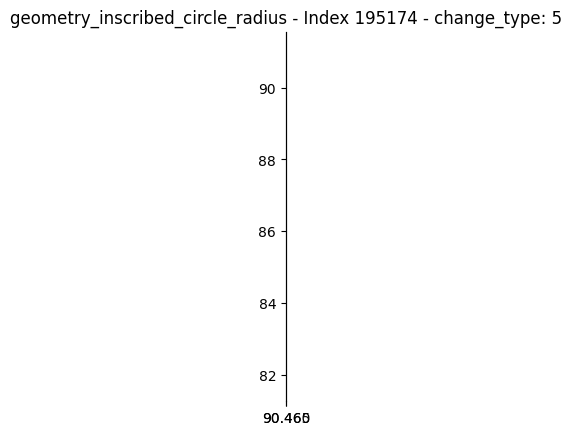

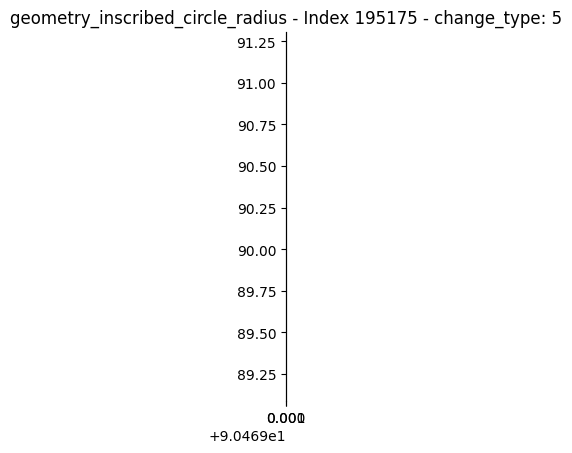

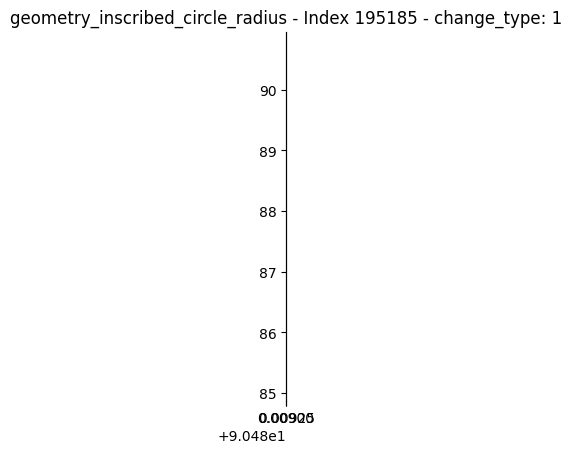


geometry_compactness contient 32 valeurs infinies ou NaN. Affichage des polygones :


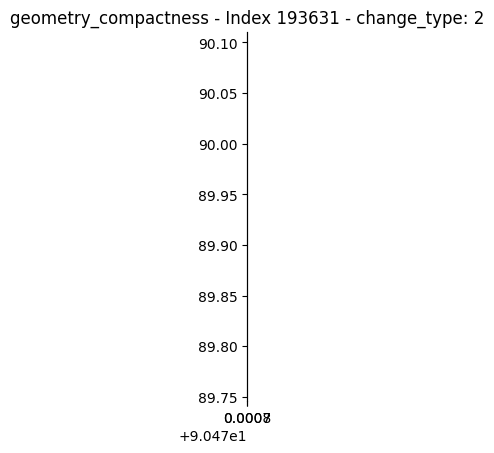

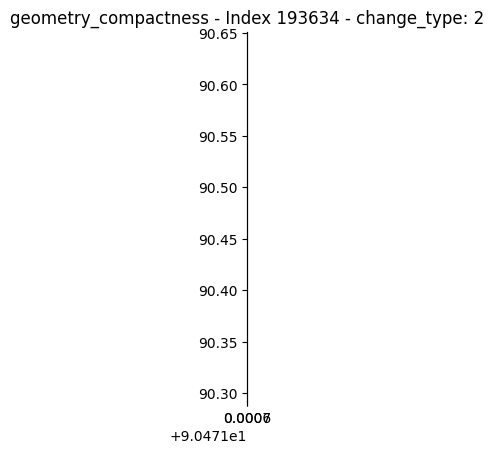

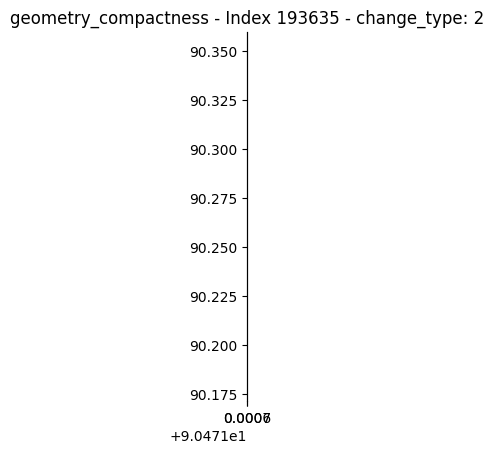

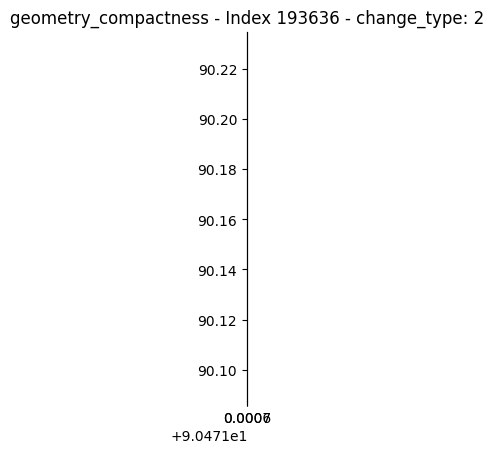

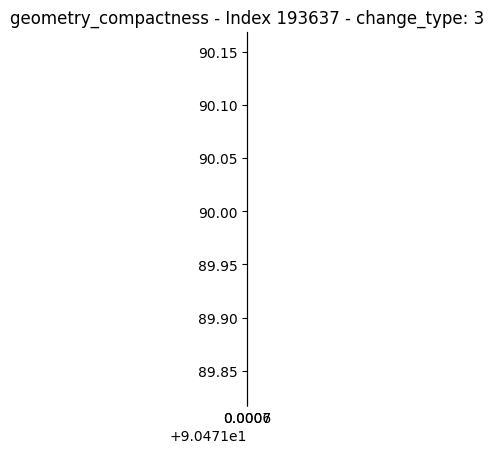

...

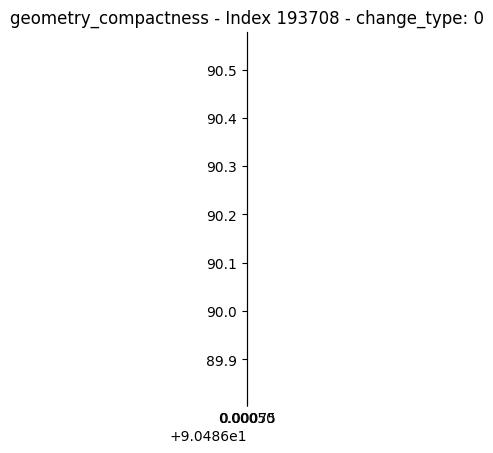

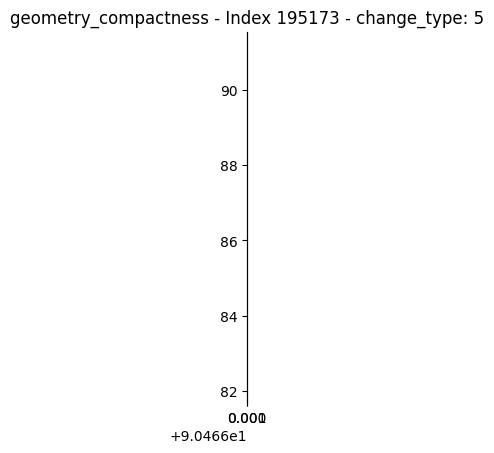

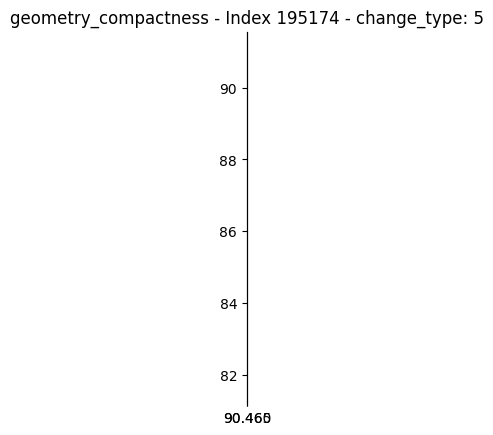

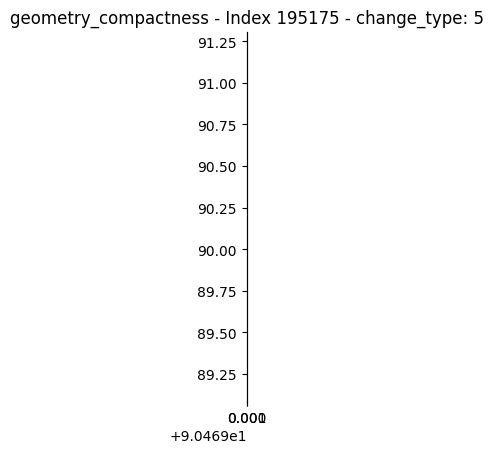

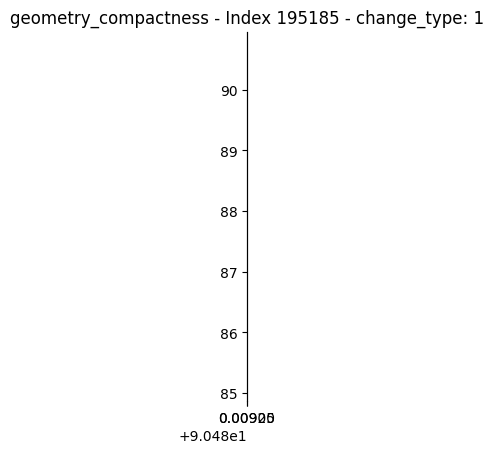


geometry_convexity_ratio contient 289 valeurs infinies ou NaN. Affichage des polygones :


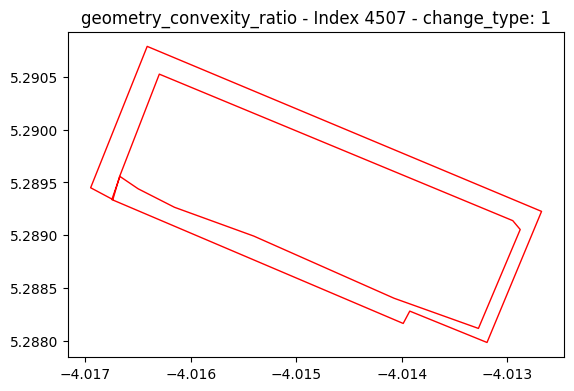

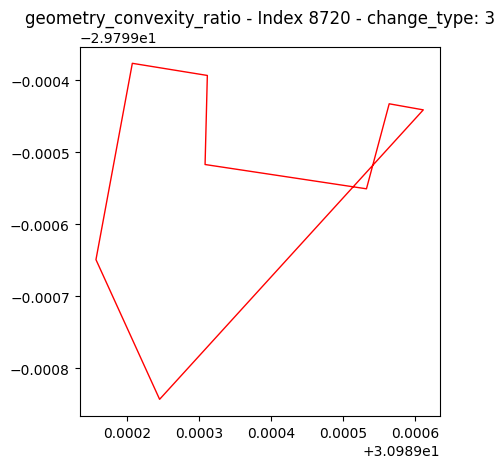

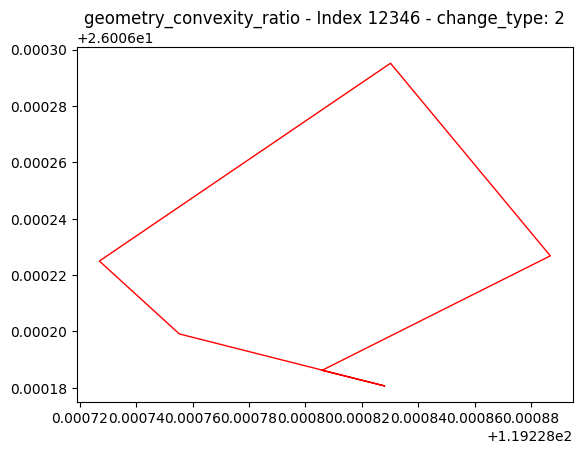

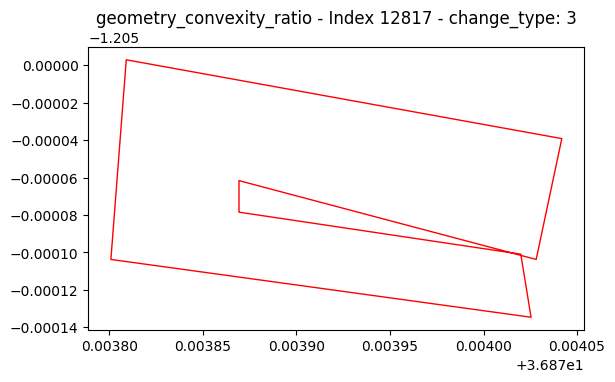

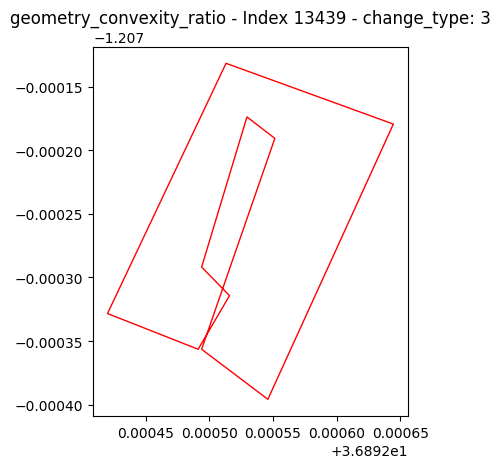

...

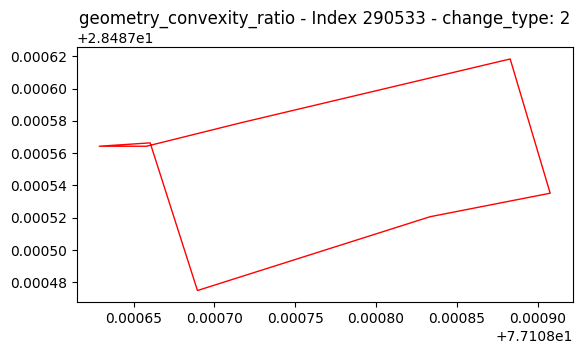

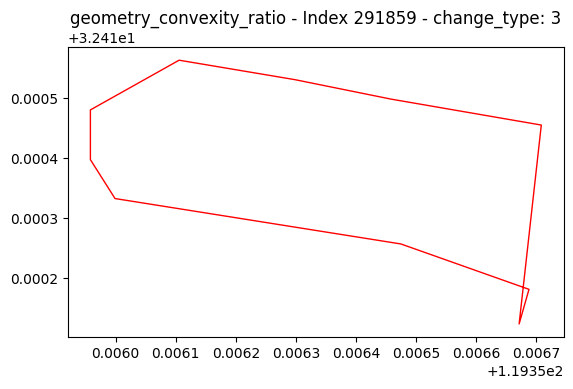

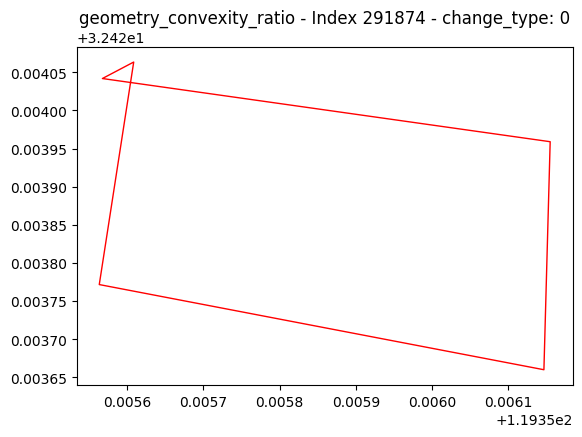

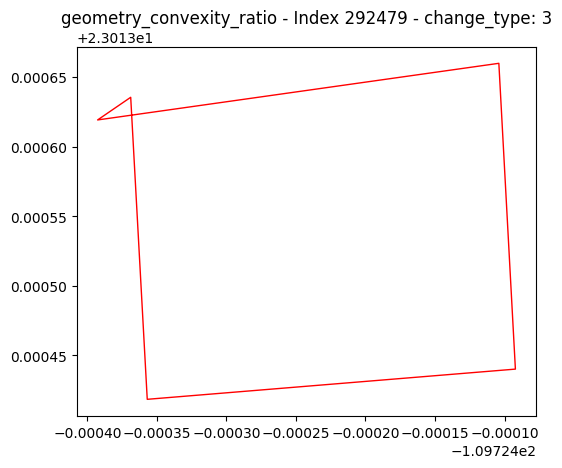

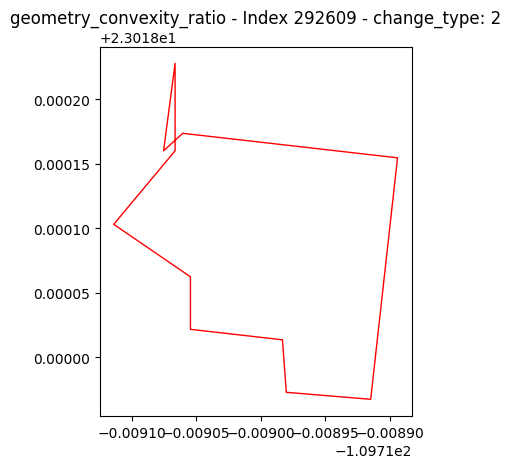


geometry_bboxwidth contient 32 valeurs infinies ou NaN. Affichage des polygones :


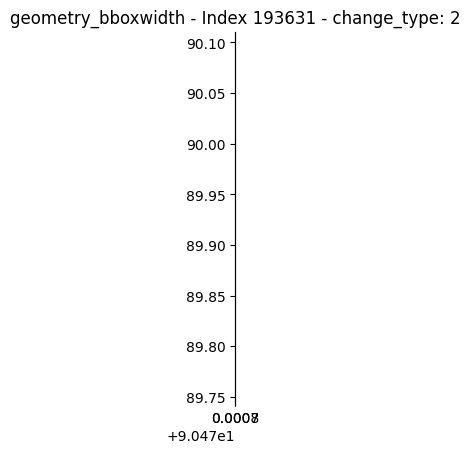

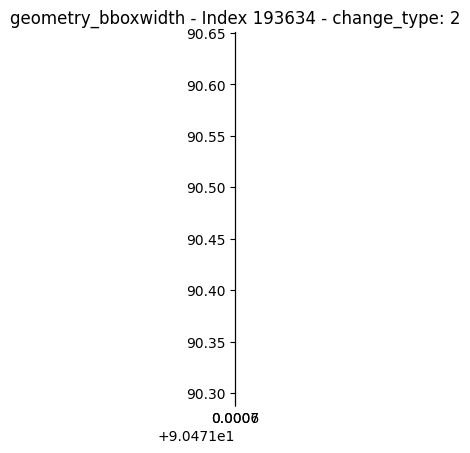

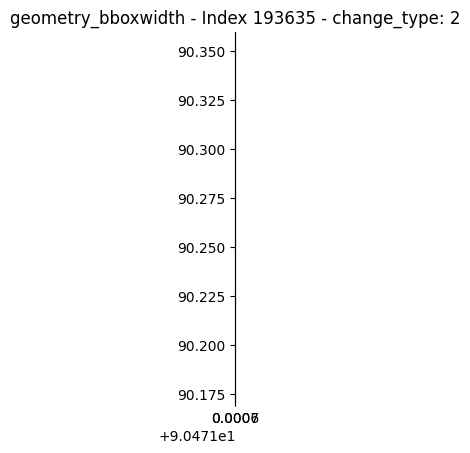

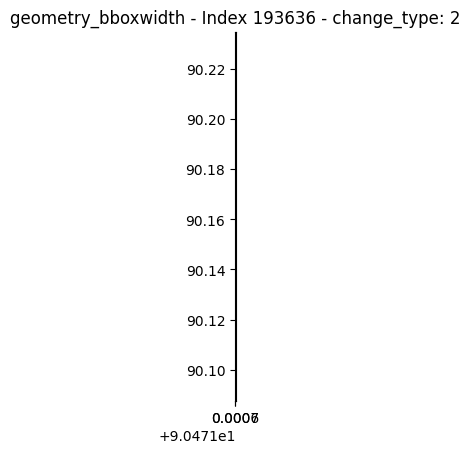

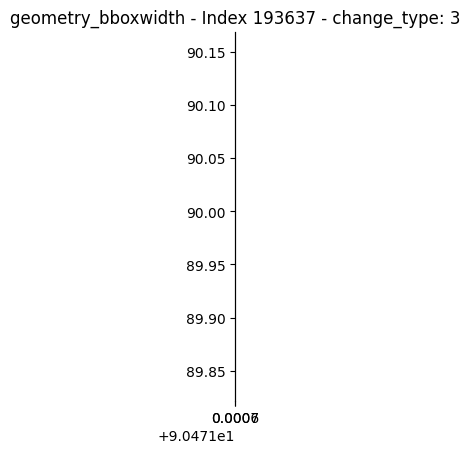

...

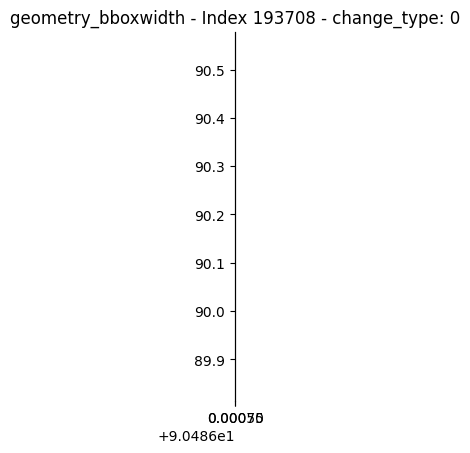

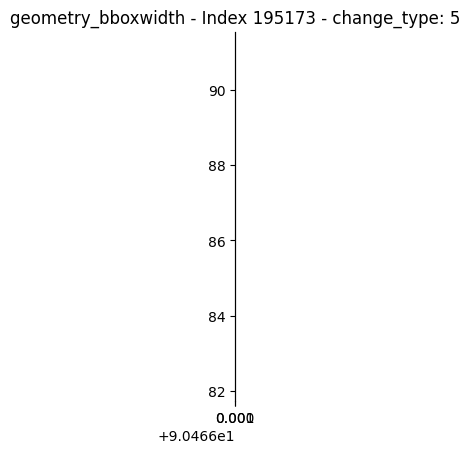

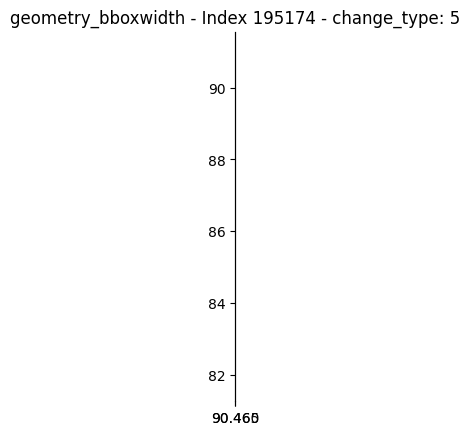

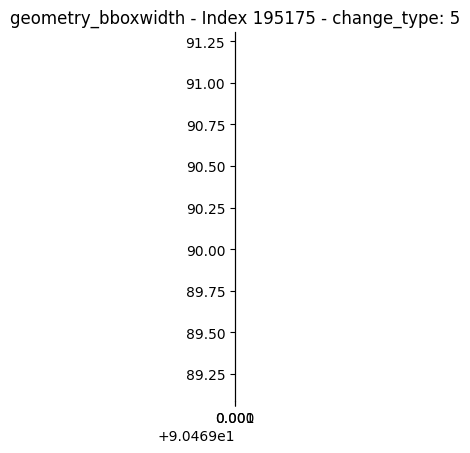

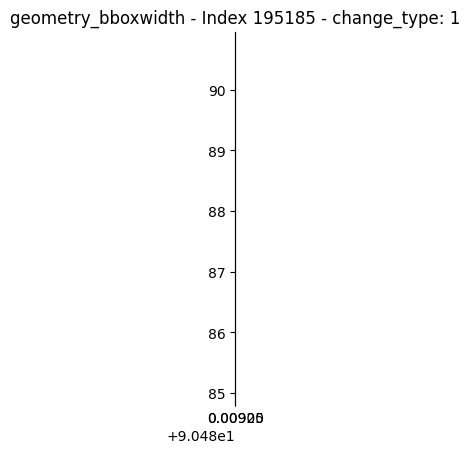


geometry_bboxheight contient 32 valeurs infinies ou NaN. Affichage des polygones :


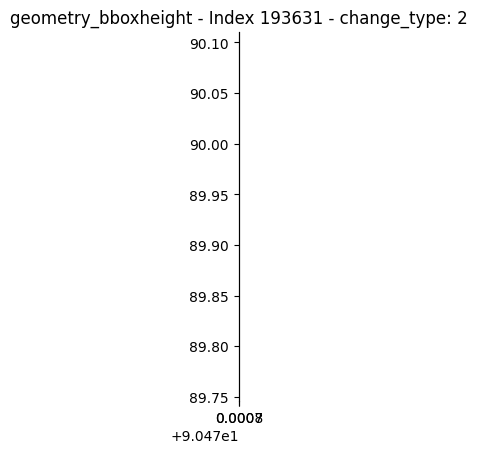

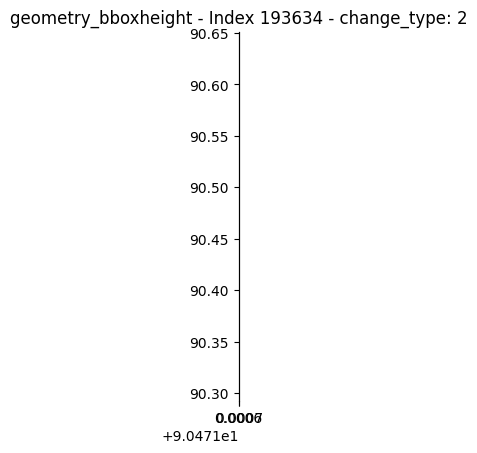

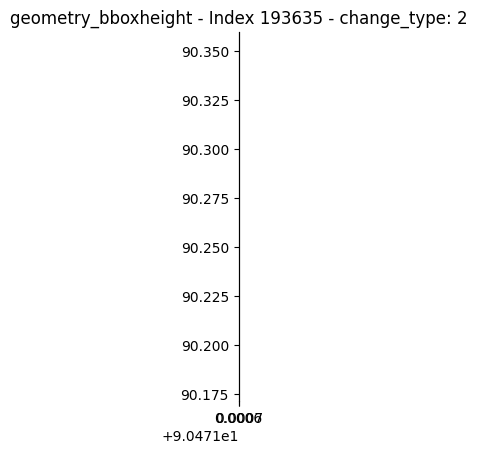

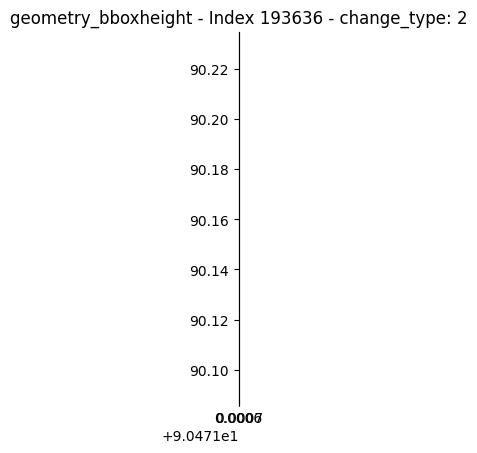

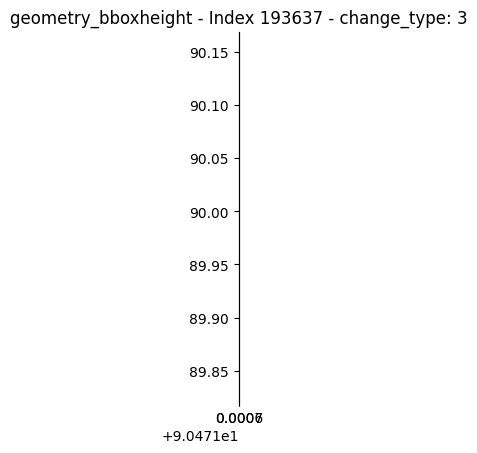

...

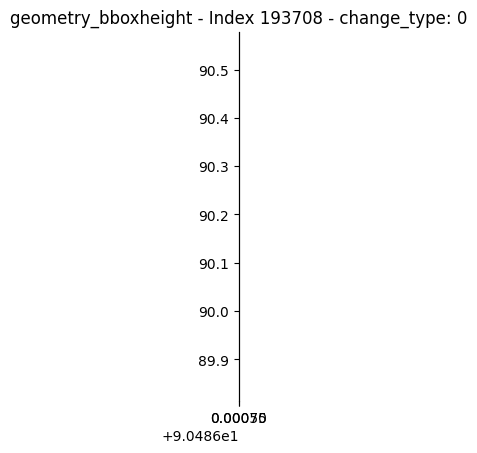

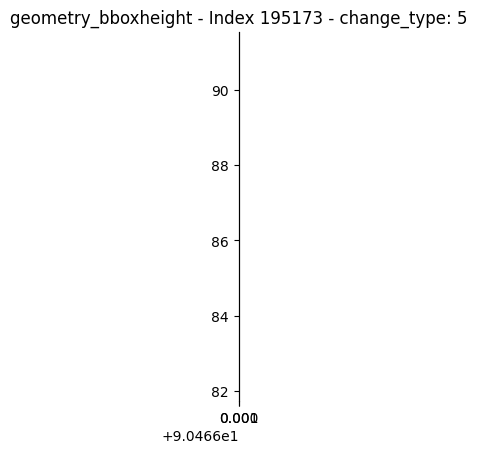

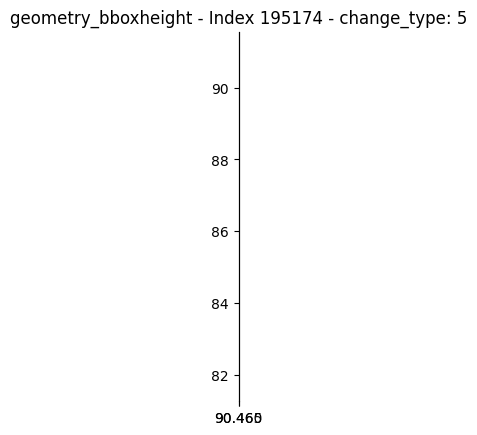

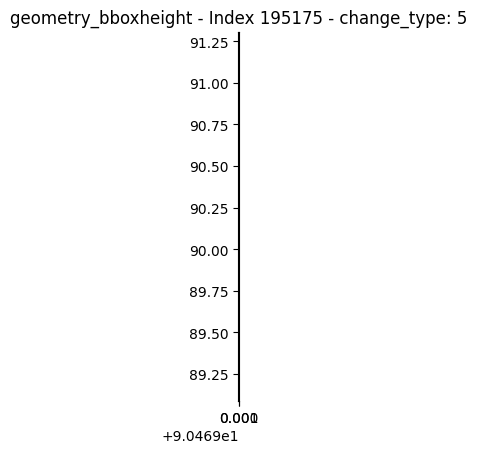

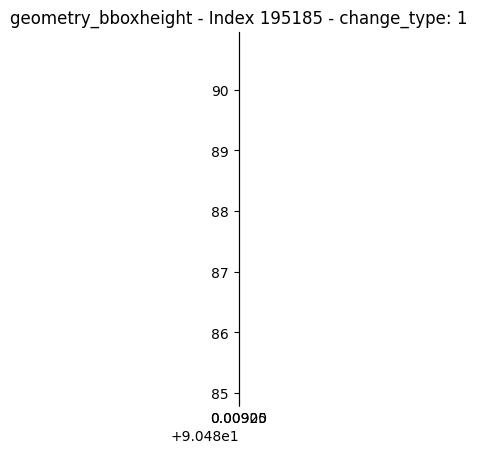


geometry_bboxratio contient 32 valeurs infinies ou NaN. Affichage des polygones :


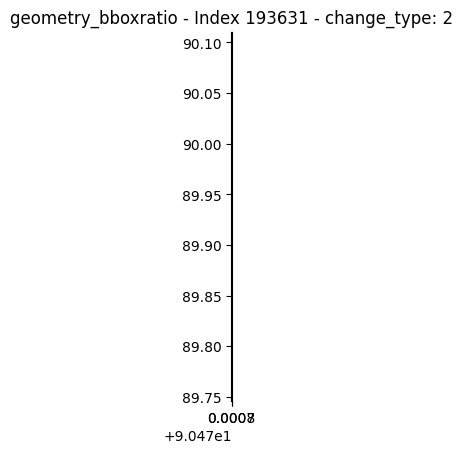

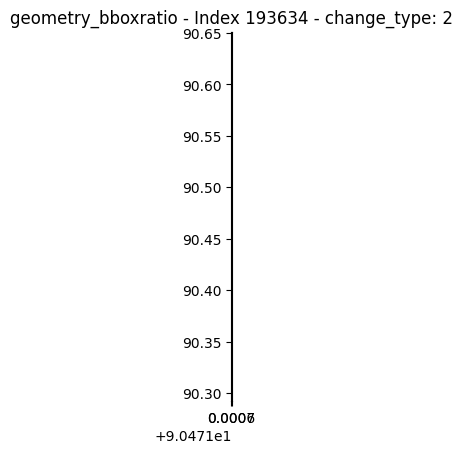

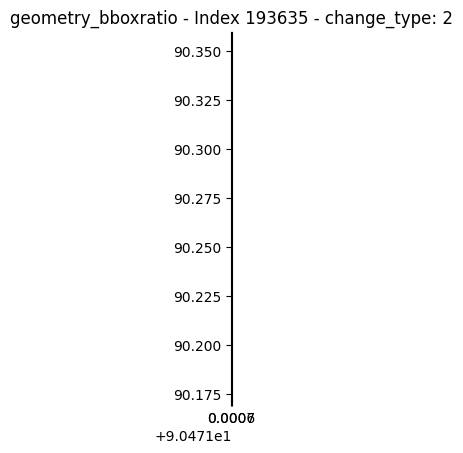

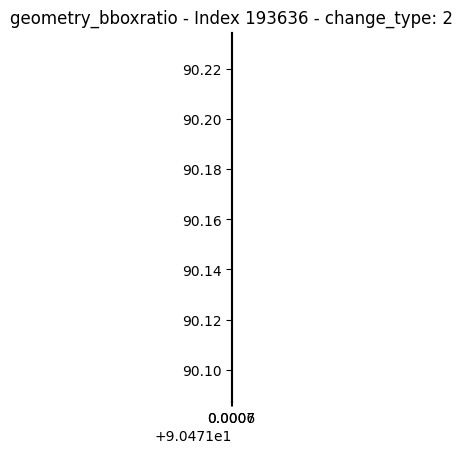

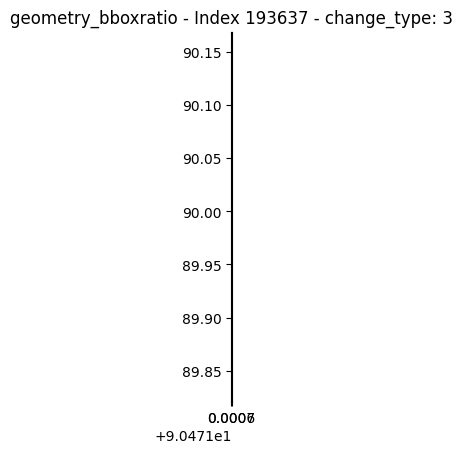

...

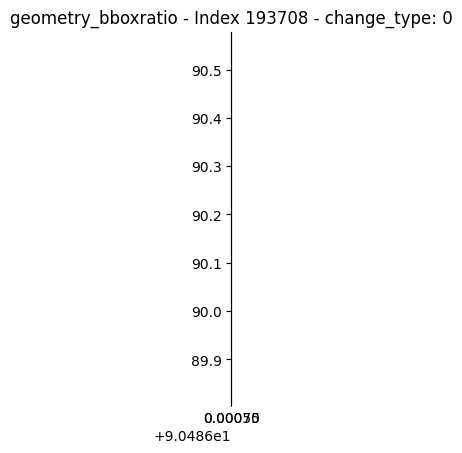

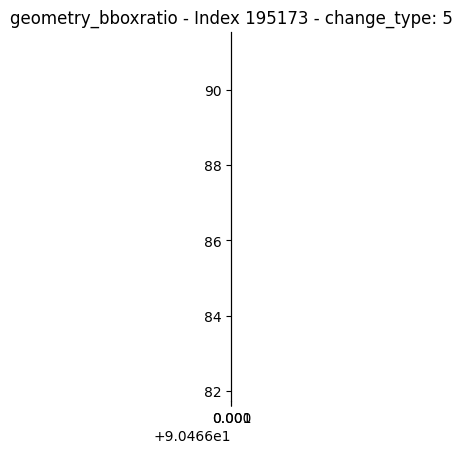

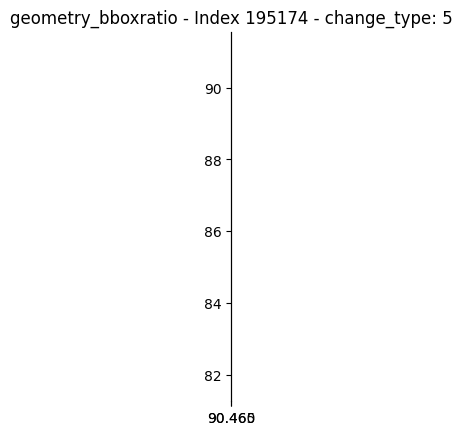

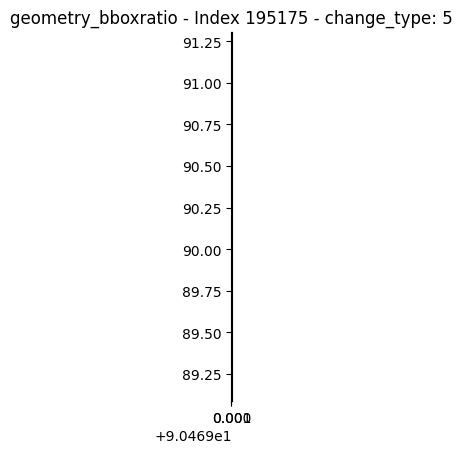

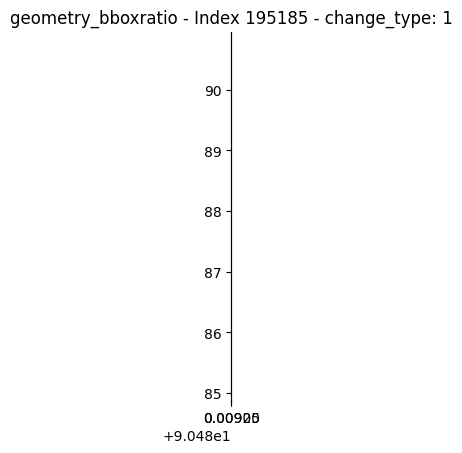


geometry_bboxarea contient 32 valeurs infinies ou NaN. Affichage des polygones :


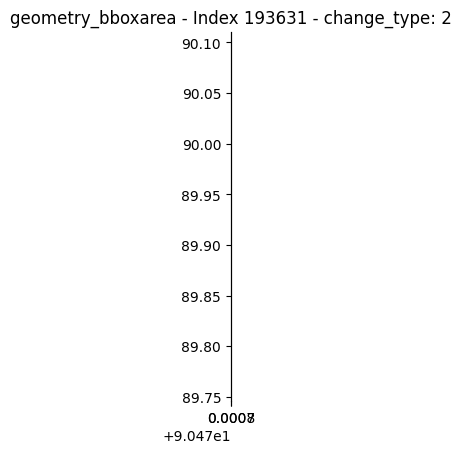

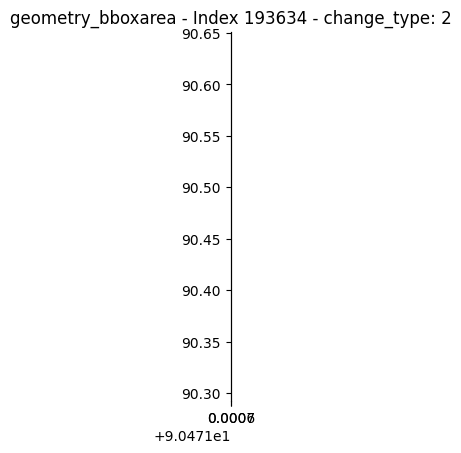

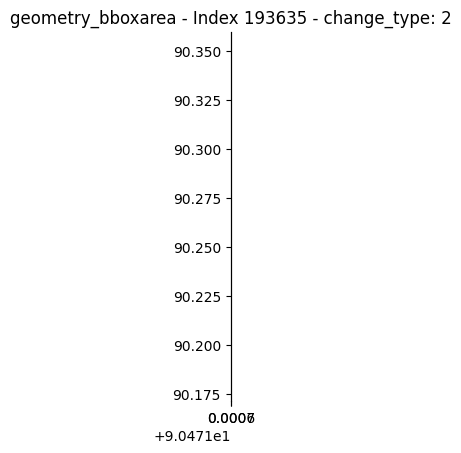

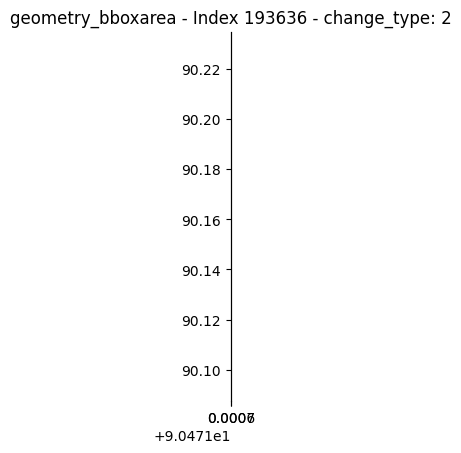

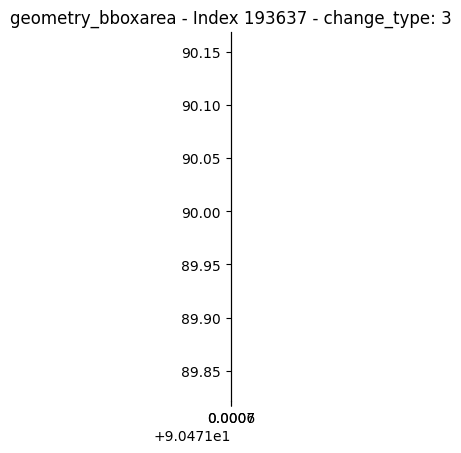

...

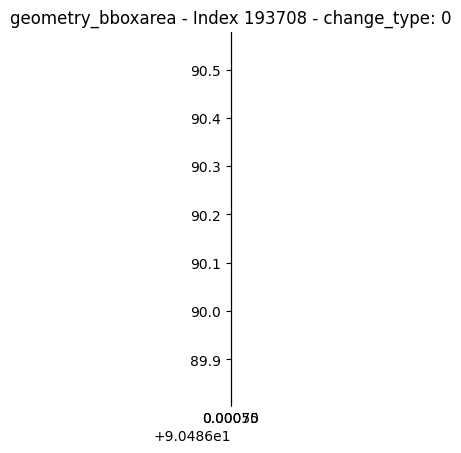

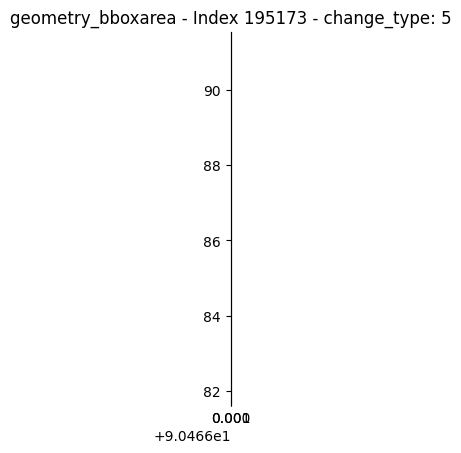

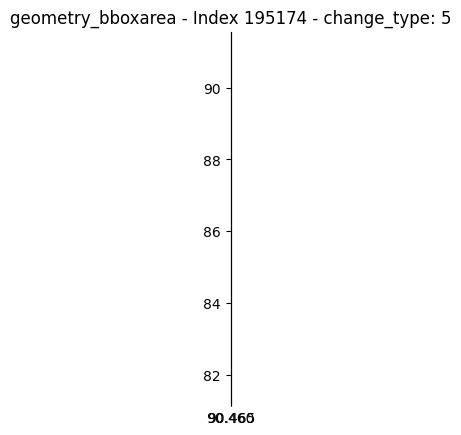

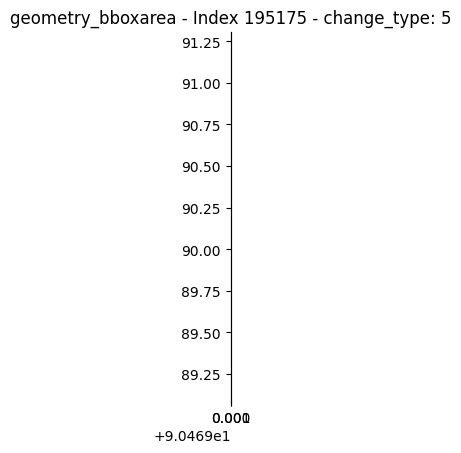

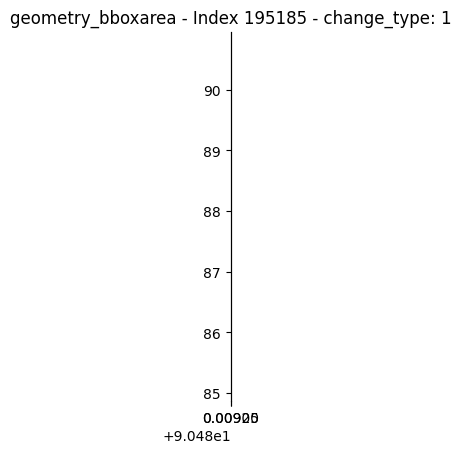


geometry_bboxperimeter contient 32 valeurs infinies ou NaN. Affichage des polygones :


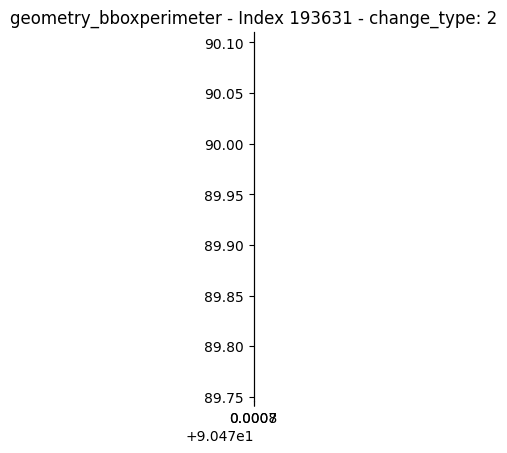

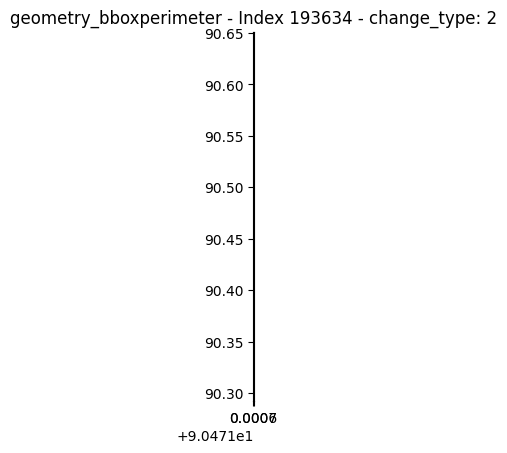

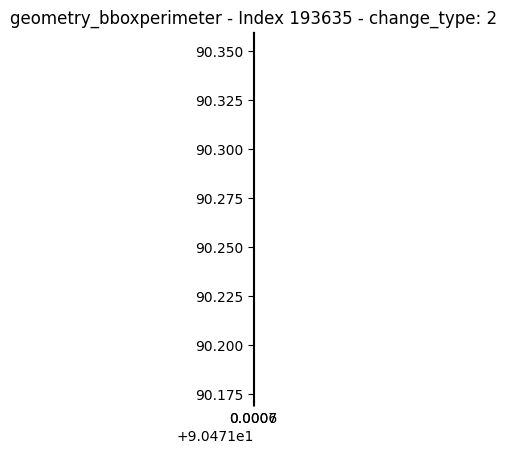

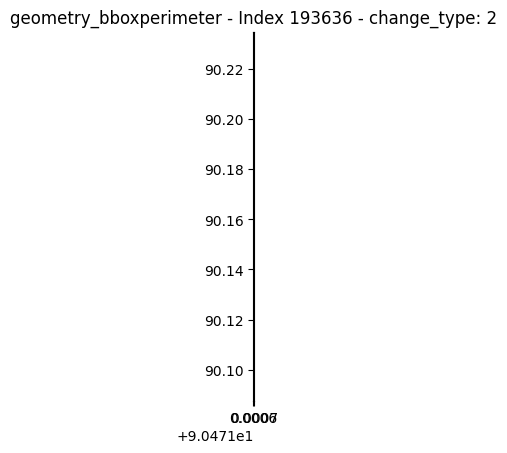

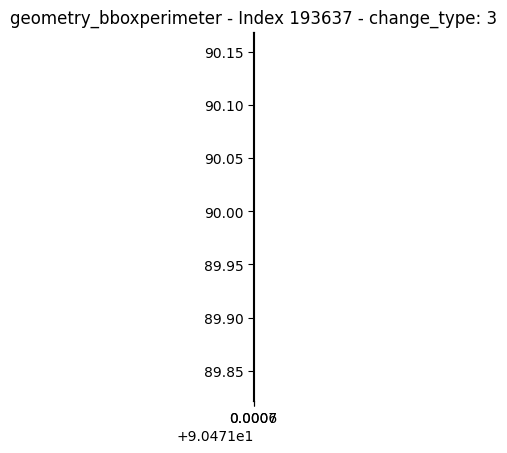

...

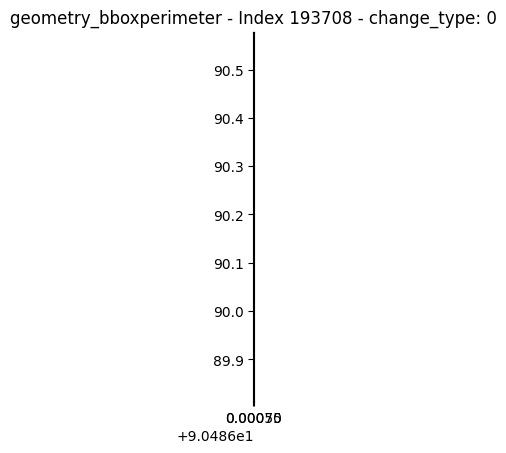

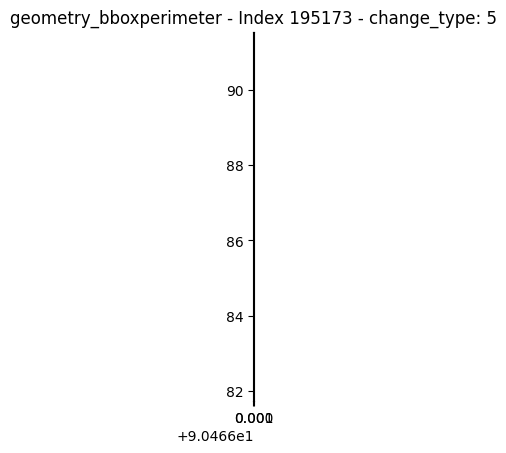

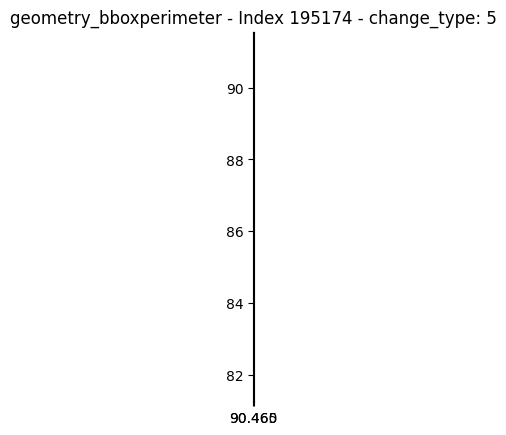

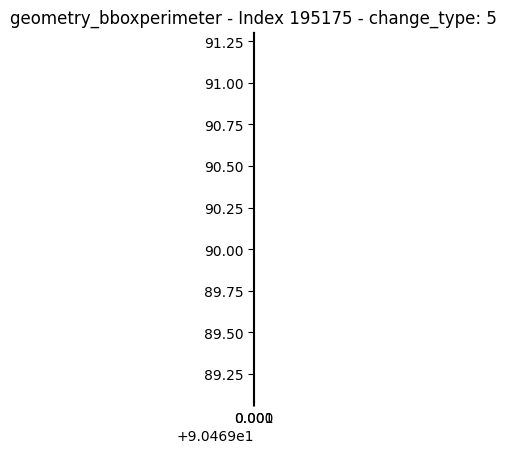

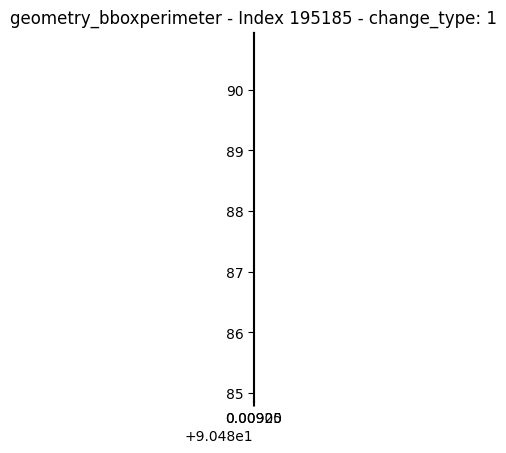


geometry_diameter contient 32 valeurs infinies ou NaN. Affichage des polygones :


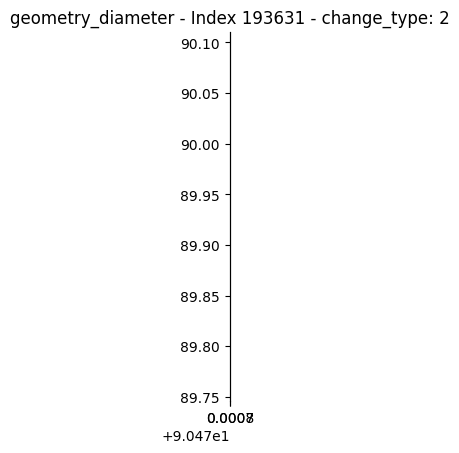

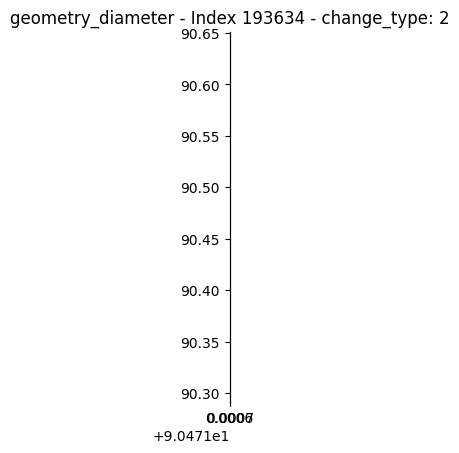

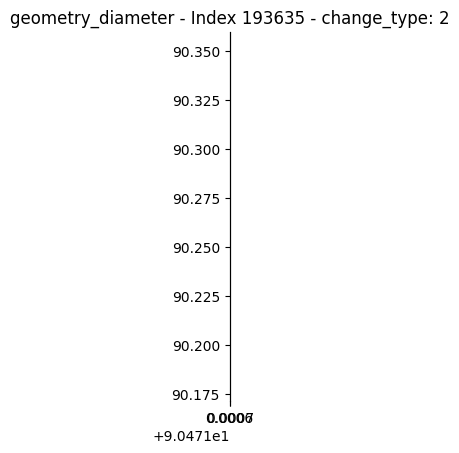

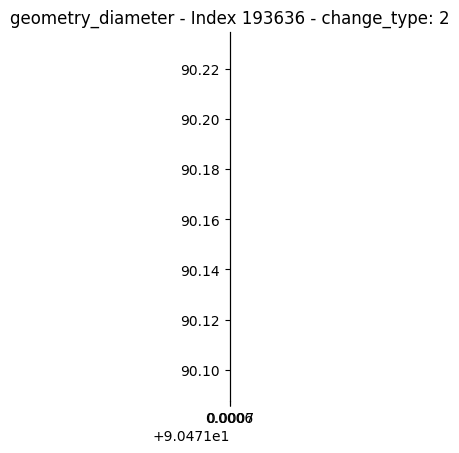

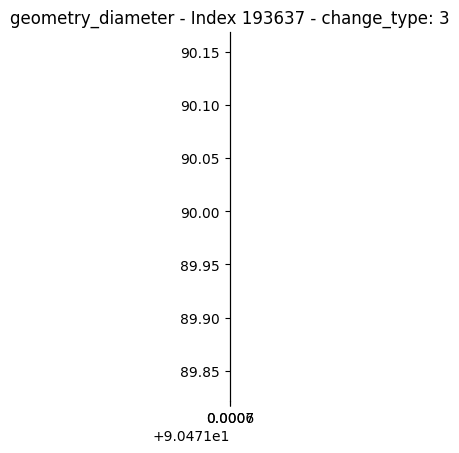

...

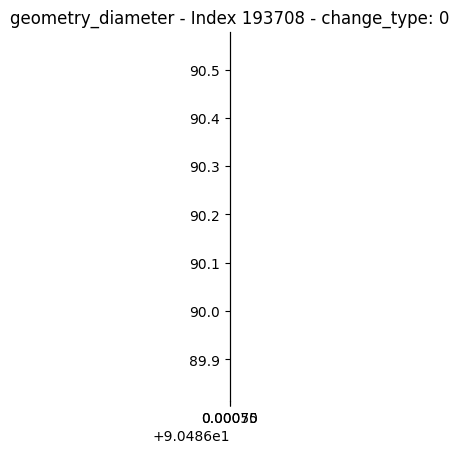

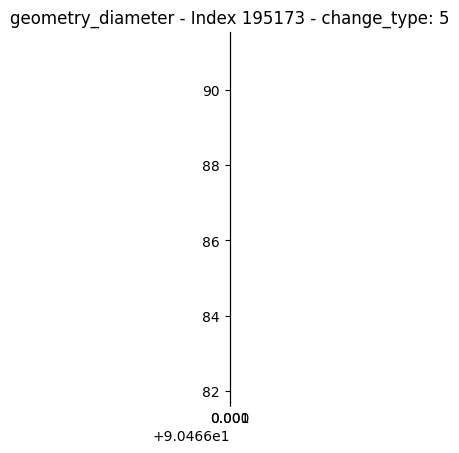

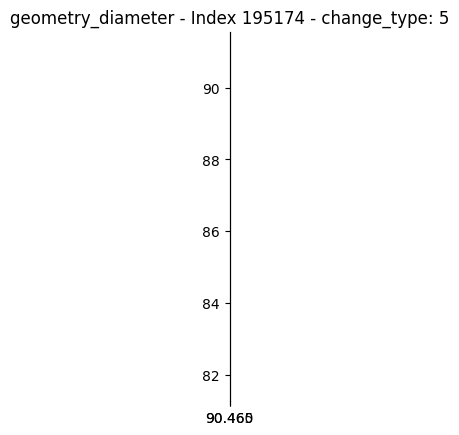

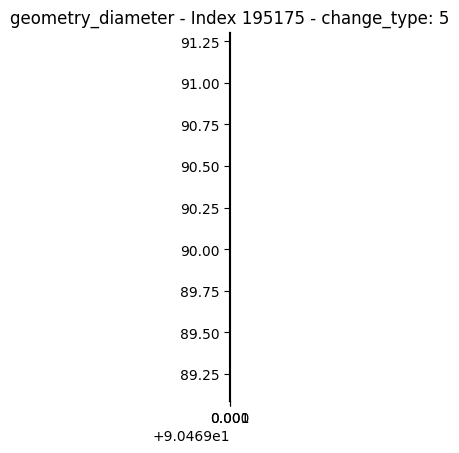

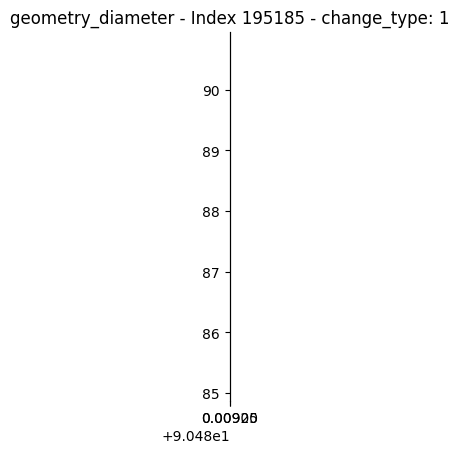

geometry_vertices ne contient pas de valeurs infinies ou NaN
geometry_minumum_bounding_circle ne contient pas de valeurs infinies ou NaN
geometry_minimum_rotated_rectangle ne contient pas de valeurs infinies ou NaN


In [29]:
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd

geom_cols = [
    'geometry_longitude', 'geometry_latitude', 'geometry_area', 'geometry_perimeter',
    'geometry_inscribed_circle_radius', 'geometry_compactness', 'geometry_convexity_ratio',
    'geometry_bboxwidth', 'geometry_bboxheight', 'geometry_bboxratio',
    'geometry_bboxarea', 'geometry_bboxperimeter', 'geometry_diameter',
    'geometry_vertices', 'geometry_minumum_bounding_circle', 'geometry_minimum_rotated_rectangle'
]

for col in geom_cols:
    if col in train_df.columns:
        # Masque pour valeurs infinies ou NaN si tu veux
        inf_mask = np.isinf(train_df[col]) | train_df[col].isna()
        inf_count = inf_mask.sum()
        if inf_count > 0:
            print(f"\n{col} contient {inf_count} valeurs infinies ou NaN. Affichage des polygones :")
            for idx in train_df[inf_mask].index:
                geom = train_df.loc[idx, 'geometry']
                ctype = train_df.loc[idx, 'change_type']
                
                fig, ax = plt.subplots()
                gpd.GeoSeries([geom]).plot(ax=ax, edgecolor='red', facecolor='none')
                ax.set_title(f"{col} - Index {idx} - change_type: {ctype}")
                plt.show()
        else:
            print(f"{col} ne contient pas de valeurs infinies ou NaN")


In [24]:
## train 

from shapely.geometry import Polygon, Point, LineString
import numpy as np
from joblib import Parallel, delayed
import multiprocessing

def irregularity_from_centroid_by_step(polygon, step=1.0):
    """
    Calcule l'irrégularité d'un polygone par rapport à son centroid.
    - polygon : objet shapely Polygon
    - step : distance entre points générés le long des arêtes
    Retourne : écart type des distances centroid -> points du polygone
    """
    centroid = polygon.centroid
    points = []
    
    coords = list(polygon.exterior.coords)
    
    for i in range(len(coords) - 1):
        A = coords[i]
        B = coords[i + 1]
        line = LineString([A, B])
        line_length = line.length
        n_steps = max(int(np.floor(line_length / step)), 1)
        for t in np.linspace(0, 1, n_steps, endpoint=False):
            points.append(line.interpolate(t, normalized=True))
    
    points.append(Point(coords[-1]))
    distances = [centroid.distance(p) for p in points]
    return np.std(distances)

# Nombre de cœurs CPU disponibles
num_cores = multiprocessing.cpu_count()

# Calcul parallélisé
irregularities = Parallel(n_jobs=num_cores)(
    delayed(irregularity_from_centroid_by_step)(poly, step=0.000005) for poly in train_df.geometry
)

# Stocker dans le GeoDataFrame
train_df['irregularity'] = irregularities



In [25]:
## test

from shapely.geometry import Polygon, Point, LineString
import numpy as np
from joblib import Parallel, delayed
import multiprocessing

def irregularity_from_centroid_by_step(polygon, step=1.0):
    """
    Calcule l'irrégularité d'un polygone par rapport à son centroid.
    - polygon : objet shapely Polygon
    - step : distance entre points générés le long des arêtes
    Retourne : écart type des distances centroid -> points du polygone
    """
    centroid = polygon.centroid
    points = []
    
    coords = list(polygon.exterior.coords)
    
    for i in range(len(coords) - 1):
        A = coords[i]
        B = coords[i + 1]
        line = LineString([A, B])
        line_length = line.length
        n_steps = max(int(np.floor(line_length / step)), 1)
        for t in np.linspace(0, 1, n_steps, endpoint=False):
            points.append(line.interpolate(t, normalized=True))
    
    points.append(Point(coords[-1]))
    distances = [centroid.distance(p) for p in points]
    return np.std(distances)

# Nombre de cœurs CPU disponibles
num_cores = multiprocessing.cpu_count()

# Calcul parallélisé
irregularities = Parallel(n_jobs=num_cores)(
    delayed(irregularity_from_centroid_by_step)(poly, step=0.000005) for poly in test_df.geometry
)

# Stocker dans le GeoDataFrame
test_df['irregularity'] = irregularities



In [ ]:
change_type_map = {'Demolition': 0, 'Road': 1, 'Residential': 2, 'Commercial': 3, 'Industrial': 4,
       'Mega Projects': 5}

train_df["change_type"] = train_df["change_type"].map(change_type_map)

train_df.to_csv("data/train_df_FINAL2.csv", index=False) ## Est égal à train_df_FINAL3.csv
test_df.to_csv("data/test_df_FINAL3.csv", index=False)